# Applying GLM-HMM to behavior data 
**Author**: Danny Burnham<br>
**Created on**: Sept 2021

This workbook explores how mouse behavioral data relates to GLM-HMM model states fit to mouse responses during a stimulus discrimination task.

In [11]:
from uobrainflex.nwb import loadbehavior as load
from uobrainflex.behavioranalysis import flex_hmm
import ssm
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import numpy as np
import pandas as pd
import scipy.fftpack
from statsmodels.tsa.stattools import grangercausalitytests
from statsmodels.tsa.stattools import adfuller

#utility functions
def moving_average(a, n=3):
    a_padded = np.pad(a, (n//2, n-1-n//2), mode='edge')
    return np.convolve(a_padded, np.ones((n,))/n, mode='valid')

def group_consecutives(vals, step=1):
    """Return list of consecutive lists of numbers from vals (number list)."""
    run = []
    result = [run]
    expect = None
    for v in vals:
        if (v == expect) or (expect is None):
            run.append(v)
        else:
            run = [v]
            result.append(run)
        expect = v + step
    return result

In [12]:
#fit GLM HMM for each session
subject='BW016'
sessions=[]
for fileID in range(20210421,20210428):
    this_session = load.get_file_path(subject,str(fileID))
    if this_session:
        sessions.append(this_session)


inpts=list([])
true_choices=list([])
sessions_trial_start =list([])
sessions_response_inds = list([])
for sess in sessions:
    trial_data, trial_labels = load.load_trial_data(sess)
    these_inpts, these_true_choices, trial_start, response_inds = flex_hmm.format_choice_behavior_hmm(trial_data, trial_labels)
    inpts.extend(these_inpts)
    true_choices.extend([these_true_choices])
    sessions_trial_start.extend([trial_start])
    sessions_response_inds.extend([response_inds])
    
# Set the parameters of the GLM-HMM
num_states = 3        # number of discrete states
obs_dim = 1           # number of observed dimensions
num_categories = 2    # number of categories for output
input_dim = 2         # input dimensions
###### Fit GLM-HMM with MAP estimation:
    
# Instantiate GLM-HMM and set prior hyperparameters (MAP version)
prior_sigma = 2
prior_alpha = 2

map_glmhmm = ssm.HMM(num_states, obs_dim, input_dim, observations="input_driven_obs", 
                     observation_kwargs=dict(C=num_categories,prior_sigma=prior_sigma),
                     transitions="sticky", transition_kwargs=dict(alpha=prior_alpha,kappa=0))

N_iters = 200
fit_map_ll = map_glmhmm.fit(true_choices, inputs=inpts, method="em", num_iters=N_iters,
                            tolerance=10**-4)

/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'hdmf-common' version 1.2.0 because version 1.5.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'core' version 2.2.5 because version 2.3.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))


  0%|          | 0/200 [00:00<?, ?it/s]

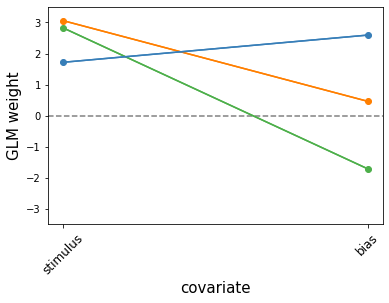

In [13]:
# Show fit 
params = map_glmhmm.observations.params
cols = ['#ff7f00', '#4daf4a', '#377eb8']
plt.axhline(y=0, color="k", alpha=0.5, ls="--")
plt.ylim([-3.5, 3.5])
for i in range(0,len(params)):
    plt.plot(params[i,:][0]*-1,marker='o',color = cols[i])
    plt.plot(params[i,:][0]*-1,color = cols[i])
plt.ylabel("GLM weight", fontsize=15)
plt.xlabel("covariate", fontsize=15)
plt.xticks([0, 1], ['stimulus', 'bias'], fontsize=12, rotation=45)
#plt.savefig("glm_state_weights.svg")
plt.show()

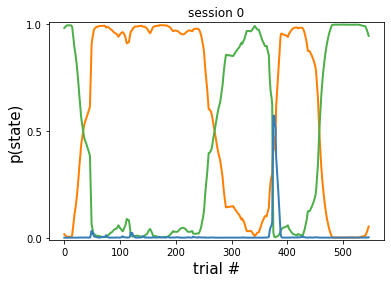

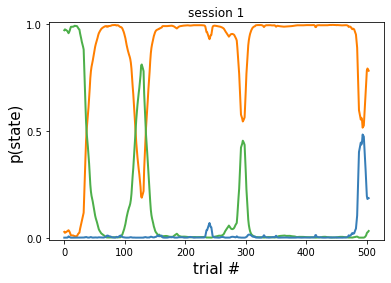

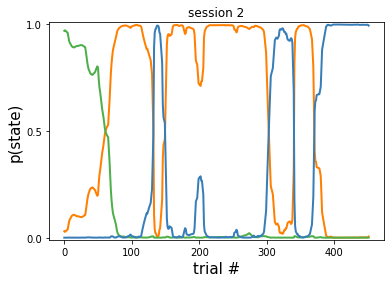

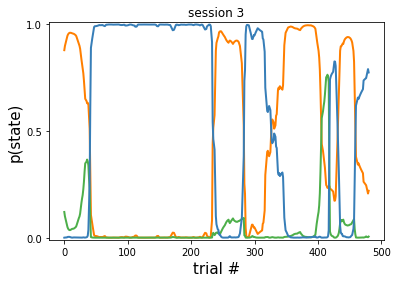

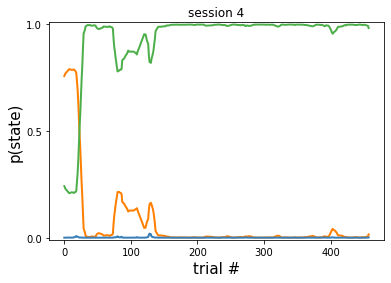

In [14]:
# Get expected states:                                                                                                                                             
posterior_probs = [map_glmhmm.expected_states(data=data, input=inpt)[0] 
                   for data, inpt in zip(true_choices, inpts)]
### plot state probability by session
if 1:
    for sess_id in range(0,len(true_choices)):
        plt.clf()
        cols = ['#ff7f00', '#4daf4a', '#377eb8']
        #sess_id = 2 #session id; can choose any index between 0 and num_sess-1
        for indst in range(num_states):
            plt.plot(posterior_probs[sess_id][:, indst], label="State " + str(indst + 1), lw=2, 
                     color=cols[indst])
        plt.ylim((-0.01, 1.01))
        plt.yticks([0, 0.5, 1], fontsize = 10)
        plt.xlabel("trial #", fontsize = 15)
        plt.ylabel("p(state)", fontsize = 15)
        plt.title('session ' + str(sess_id))
        #plt.savefig(f"Pstate_session{sess_id}.svg")
        plt.show() 

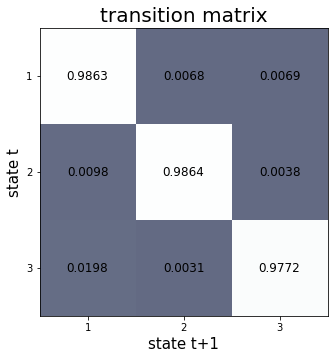

In [15]:
### plot state transition matrix
recovered_trans_mat = np.exp(map_glmhmm.transitions.log_Ps)
plt.imshow(recovered_trans_mat, vmin=-0.8, vmax=1, cmap='bone')
for i in range(recovered_trans_mat.shape[0]):
    for j in range(recovered_trans_mat.shape[1]):
        text = plt.text(j, i, str(np.around(recovered_trans_mat[i, j], decimals=4)), ha="center", va="center",
                        color="k", fontsize=12)
plt.xlim(-0.5, num_states - 0.5)
plt.xlabel('state t+1', fontsize = 15)
plt.ylabel('state t', fontsize = 15)
plt.xticks(range(0, num_states), ('1', '2', '3'), fontsize=10)
plt.yticks(range(0, num_states), ('1', '2', '3'), fontsize=10)
plt.ylim(num_states - 0.5, -0.5)
plt.title("transition matrix", fontsize = 20)
plt.subplots_adjust(0, 0, 1, 1)
#plt.savefig("transition_matrix.svg")

Text(0, 0.5, 'frac. occupancy')

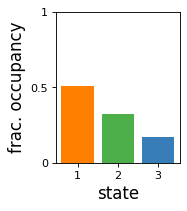

In [16]:
### plot state occupancy
# Get expected states:
posterior_probs = [map_glmhmm.expected_states(data=data, input=inpt)[0]
                   for data, inpt
                   in zip(true_choices, inpts)]
# concatenate posterior probabilities across sessions
posterior_probs_concat = np.concatenate(posterior_probs)
# get state with maximum posterior probability at particular trial:
state_max_posterior = np.argmax(posterior_probs_concat, axis = 1)
# now obtain state fractional occupancies:
_, state_occupancies = np.unique(state_max_posterior, return_counts=True)
state_occupancies = state_occupancies/np.sum(state_occupancies)

#plot
fig = plt.figure(figsize=(2, 2.5), dpi=80, facecolor='w', edgecolor='k')
for z, occ in enumerate(state_occupancies):
    plt.bar(z, occ, width = 0.8, color = cols[z])
plt.ylim((0, 1))
plt.xticks([0, 1, 2], ['1', '2', '3'], fontsize = 10)
plt.yticks([0, 0.5, 1], ['0', '0.5', '1'], fontsize=10)
plt.xlabel('state', fontsize = 15)
plt.ylabel('frac. occupancy', fontsize=15)
#plt.savefig("state_occupancy.svg")

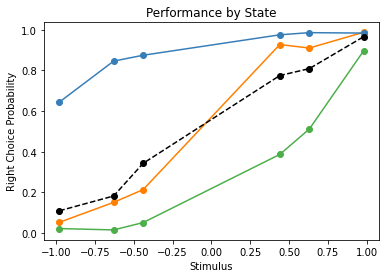

In [17]:
### generate psychometrics per state
#concatenate inpts and choices
inpts_concat = np.concatenate(inpts)
trial_inpts = inpts_concat[:,0]
choice_concat = np.concatenate(true_choices)

state_inpt_choice = pd.DataFrame(data=[],index=np.unique(state_max_posterior), columns = np.unique(trial_inpts))
trial_n = pd.DataFrame(data=[],index=np.unique(state_max_posterior), columns = np.unique(trial_inpts))
for iState in range(0,num_states):
        state_ind = np.where(state_max_posterior == iState)[0].astype(int)
        state_inpts = trial_inpts[state_ind]
        state_choices = choice_concat[state_ind]
        for iInp in np.unique(state_inpts):
            these_trials = np.where(state_inpts == iInp)[0]
            #if iInp > 0:
                #correct_choice = 1
                #mult=1
            #if iInp <0:
                #correct_choice = 0
                #mult=-1
            #state_inpt_choice.loc[iState,iInp] = len(np.where(state_choices[these_trials]==correct_choice)[0])/len(these_trials)*mult
            state_inpt_choice.loc[iState,iInp] = len(np.where(state_choices[these_trials]==1)[0])/len(these_trials)
            trial_n.loc[iState,iInp] =len(these_trials)




for iInp in np.unique(trial_inpts):
    these_trials = np.where(trial_inpts == iInp)[0]
    state_inpt_choice.loc['all_trials',iInp] = len(np.where(choice_concat[these_trials]==1)[0])/len(these_trials)
    trial_n.loc['all_trials',iInp] = len(these_trials)
    
actual_inpts = [-.98, -.63, -.44, .44, .63, .98]
state_inpt_choice.columns = actual_inpts
    
plt.clf()
plt.xlabel('Stimulus')
plt.ylabel('Right Choice Probability')
plt.title('Performance by State')
for idx in state_inpt_choice.index:
    if idx == 'all_trials':
        plt.plot(state_inpt_choice.iloc[3,:],'k--',marker='o')
    if idx != 'all_trials':
        plt.plot(state_inpt_choice.loc[idx,:],marker='o', color=cols[idx])   
#plt.savefig("performance_by_state.svg")
plt.show()  

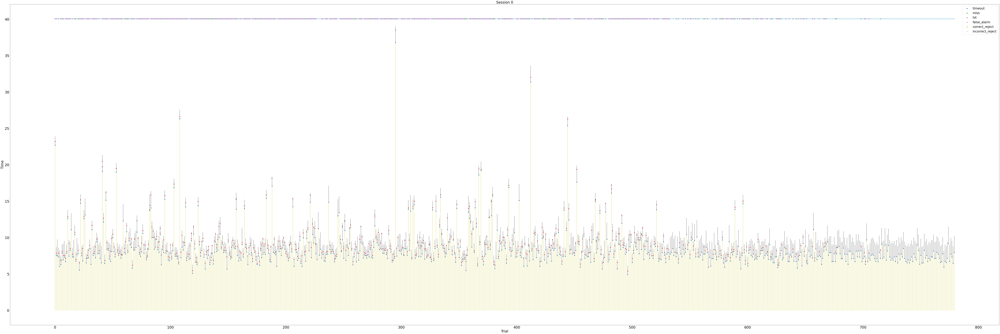

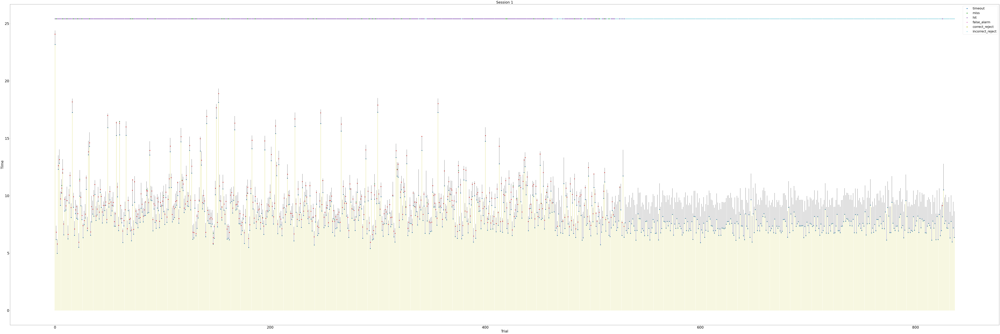

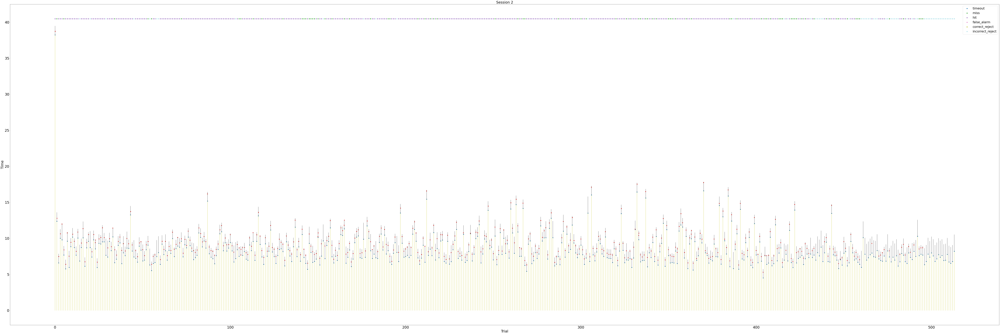

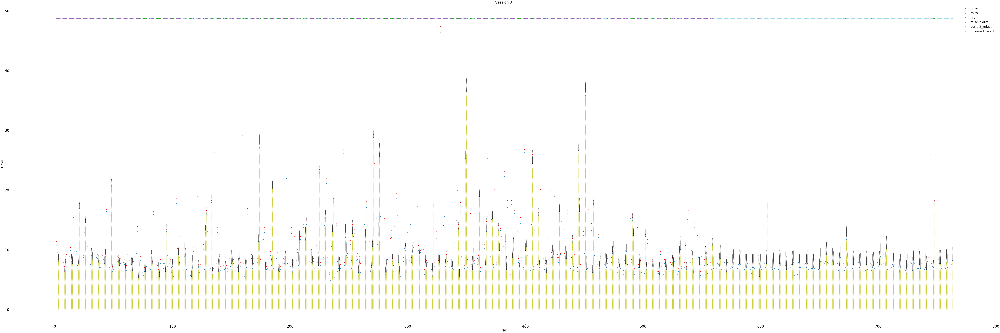

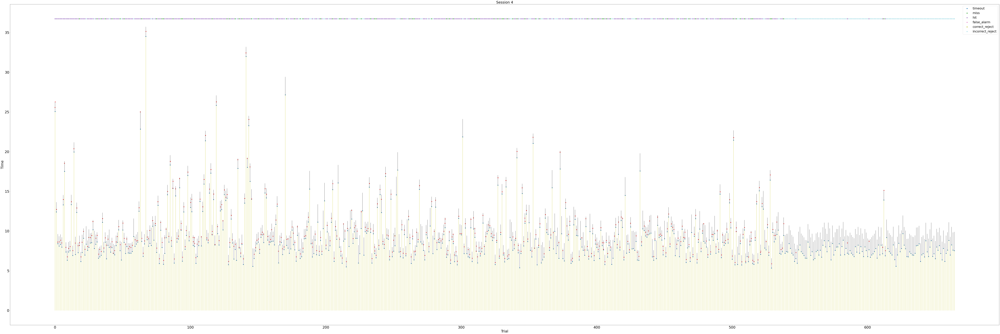

In [23]:
#plot results of each trial per session. intertrial interval, stimulus time, likc time, reward time
fontsize = 30
ticksize = 30
fontsize_legend = 26

for ind in range(len(sessions)): # iterate this for looking across sessions       
    trial_data, trial_labels = load.load_trial_data(sessions[ind])#get animal responses during session
    behavior_events, behavior_events_indices = load.load_behavior_events(sessions[ind])#get behavior events time stamps and session index values

    
    speriod = 0.001
    rl = behavior_events_indices['reward_left']*speriod
    rr = behavior_events_indices['reward_right']*speriod
    ll = behavior_events_indices['licks_left']*speriod
    lr = behavior_events_indices['licks_right']*speriod
    
    fig, ax = plt.subplots(figsize=(150, 50))#create figure and axes for sinusoid loss 
    prev_start = 0.0
    stim_times = []
    rl_times, rl_trials = [], []
    rr_times, rr_trials = [], []
    lr_times, lr_trials = [], []
    ll_times, ll_trials = [], []
    
    miss = []
    hit = []
    timeout = []
    false_alarm = []
    correct_reject = []
    incorrect_reject = []
    
    
    cmap = plt.get_cmap("tab20")
    c_inds = np.linspace(0.0, 1.0, num=len(trial_labels['outcome'].keys()))
    c_list = cmap(c_inds)
    
    max_trial_duration = 0.0
    
    for i in range(trial_data.shape[0]): #for each trial
        trial_duration = trial_data.loc[i, 'stop_time'] - trial_data.loc[i, 'start_time']
        inter_trial_duration = trial_data.loc[i, 'start_time'] - prev_start
        ax.vlines(i, 0.0, inter_trial_duration, colors='y', linestyles='dashed')
        ax.vlines(i, inter_trial_duration, inter_trial_duration+trial_duration, colors='k', linestyles='dashed')
        prev_start = trial_data.loc[i, 'start_time']
        prev_end = trial_data.loc[i, 'stop_time']
        
        #find behavioral events within time window of trial
        rl_inds = np.where((rl >= trial_data.loc[i, 'start_time']) & (rl <= trial_data.loc[i, 'stop_time']))
        rr_inds = np.where((rr >= trial_data.loc[i, 'start_time']) & (rr <= trial_data.loc[i, 'stop_time']))
        ll_inds = np.where((ll >= trial_data.loc[i, 'start_time']) & (ll <= trial_data.loc[i, 'stop_time']))
        lr_inds = np.where((lr >= trial_data.loc[i, 'start_time']) & (lr <= trial_data.loc[i, 'stop_time']))

        #if the search returns indices, grab the actual event times
        if rl_inds[0].size > 0:#check if array of indices is not empty
            #if not empty, grab the FIRST right lick event time relative to the trial start and inter trial duration.
            rl_times.append(rl[rl_inds[0][0]] - trial_data.loc[i,'start_time'] + inter_trial_duration)
            rl_trials.append(i)#store the trial number for plotting trial outcome
        if rr_inds[0].size > 0:#check if array of indices is not empty
            #if not empty, grab the FIRST right reward event time relative to the trial start and inter trial duration.
            rr_times.append(rr[rr_inds[0][0]] - trial_data.loc[i,'start_time'] + inter_trial_duration)
            rr_trials.append(i)#store the trial number for plotting trial outcome
        if ll_inds[0].size > 0:#check if array of indices is not empty
            #if not empty, grab the FIRST left lick event time relative to the trial start and inter trial duration.
            ll_times.append(ll[ll_inds[0][0]] - trial_data.loc[i,'start_time'] + inter_trial_duration)
            ll_trials.append(i)#store the trial number for plotting trial outcome
        if lr_inds[0].size > 0:#check if array of indices is not empty
            #if not empty, grab the FIRST left reward event time relative to the trial start and inter trial duration.
            lr_times.append(lr[lr_inds[0][0]] - trial_data.loc[i,'start_time'] + inter_trial_duration)
            lr_trials.append(i)#store the trial number for plotting trial outcome
        
        stim_times.append(trial_data.loc[i,'stimulus_time'] - trial_data.loc[i,'start_time'] + inter_trial_duration)
        
        if trial_duration + inter_trial_duration > max_trial_duration:
            max_trial_duration = trial_duration + inter_trial_duration
            

        if trial_data.loc[i, 'outcome'] == 0:
            timeout.append(i)
        elif trial_data.loc[i, 'outcome'] == 1:
            hit.append(i)
        elif trial_data.loc[i, 'outcome'] == 2:
            miss.append(i)
        elif trial_data.loc[i, 'outcome'] == 4:
            false_alarm.append(i)
        elif trial_data.loc[i, 'outcome'] == 8:
            correct_reject.append(i)
        elif trial_data.loc[i, 'outcome'] == 16:
            incorrect_reject.append(i)
        else:
            pass
            
            
    ax.scatter(range(trial_data.shape[0]), stim_times)
    ax.scatter(rl_trials, rl_times, c='g', marker="<")
    ax.scatter(rr_trials, rr_times, c='g', marker=">")
    ax.scatter(ll_trials, ll_times, c='r', marker="<")
    ax.scatter(lr_trials, lr_times, c='r', marker=">")
    
    #plot outcomes
    outcomes_dict = {'timeout':timeout, 'miss':miss, 'hit':hit,
                    'false_alarm':false_alarm, 'correct_reject':correct_reject,
                    'incorrect_reject':incorrect_reject}
    cind = 0
    for label in outcomes_dict.keys():
        ax.scatter(outcomes_dict[label], (max_trial_duration + 1)*np.ones(len(outcomes_dict[label])), color=c_list[cind], marker="s", label=label)
        cind+=1
    
    ax.set_title('Session ' + str(ind), fontsize=fontsize)
    ax.set_xlabel('Trial', fontsize=fontsize)
    ax.set_ylabel('Time', fontsize=fontsize)
    #ax.set_xticks(range(i))
    #ax.set_yticks(np.arange(0.0, max_trial_duration + 1, 0.5))
    ax.tick_params(axis='x', labelsize= ticksize)# to Set Matplotlib Tick Labels Font Size
    ax.tick_params(axis='y', labelsize= ticksize)# to Set Matplotlib Tick Labels Font Size
    ax.legend(loc='upper right', fontsize=fontsize_legend)
    

In [24]:
#get pupil size in 500 ms window before stimulus onset, or trial start.
#strategy: 1) get trial start in seconds, 2) back up 500 ms, grab that window from pupil data, 3) average it
#get pupil size 500 ms window before lick/reward
def pupilPlusStatePlot(which_behavioral_event, pupil_stat, event_side, time_window, smoothing_window, pupil_norm, **kwargs):
    fontsize = 30
    ticksize = 30
    fontsize_legend = 26
    if ('save_filename' in kwargs.keys()):
        from matplotlib.backends.backend_pdf import PdfPages
        fname = save_filename + '.pdf'
        pp = PdfPages(fname)

    for ind in range(len(sessions)): # iterate this for looking across sessions       
        trial_start = sessions_trial_start[ind]#from list of trial start indices, get trial starts for this session
        trial_response_inds = sessions_response_inds[ind]

        s_ind = 0
        t_ind = 0

        trial_data, trial_labels = load.load_trial_data(sessions[ind])#get animal responses during session
        behavior_events, behavior_events_indices = load.load_behavior_events(sessions[ind])#get behavior events time stamps and session index values
        behavior_measures = load.load_behavior_measures(sessions[ind], speriod=0.001)#get animal behavior during session
        idx = behavior_measures.index

        speriod = 0.001
        rl = behavior_events_indices['reward_left']*speriod
        rr = behavior_events_indices['reward_right']*speriod
        ll = behavior_events_indices['licks_left']*speriod
        lr = behavior_events_indices['licks_right']*speriod

        miss = []
        hit = []
        timeout = []
        false_alarm = []
        correct_reject = []
        incorrect_reject = []
        sess_pupil_data = []

        for i in range(trial_start.shape[0]): #for each trial
            start_time = trial_start[i]
            temp_ind =  trial_response_inds[i]
            this_trial_data = trial_data.iloc[[temp_ind]]

            if which_behavioral_event == 'lick':#'lick, reward or stimulus'
                #find lick behavioral events within time window of trial
                rl_inds = np.where((rl >= this_trial_data.loc[temp_ind,'start_time']) & (rl <= this_trial_data.loc[temp_ind,'stop_time']))
                ll_inds = np.where((ll >= this_trial_data.loc[temp_ind,'start_time']) & (ll <= this_trial_data.loc[temp_ind,'stop_time']))
                #if the search returns indices, grab the actual event time
                if (rl_inds[0].size > 0) and (ll_inds[0].size > 0):#if both left and right licks occur in this trial
                    event_time = min(rl_inds[0][0], ll_inds[0][0])#take the lick that happens first
                elif rl_inds[0].size > 0:#check if array of indices is not empty
                    #if not empty, grab the FIRST right lick event time relative to the trial start and inter trial duration.
                    event_time = rl[rl_inds[0][0]]
                elif ll_inds[0].size > 0:#check if array of indices is not empty
                    #if not empty, grab the FIRST left lick event time relative to the trial start and inter trial duration.
                    event_time = ll[ll_inds[0][0]]
                else:# if no response, take the lick time to be the trial start
                    event_time = start_time

            elif which_behavioral_event == 'reward':#'lick, reward or stimulus'
                #find reward behavioral events within time window of trial
                rr_inds = np.where((rr >= this_trial_data.loc[temp_ind,'start_time']) & (rr <= this_trial_data.loc[temp_ind,'stop_time']))
                lr_inds = np.where((lr >= this_trial_data.loc[temp_ind,'start_time']) & (lr <= this_trial_data.loc[temp_ind,'stop_time']))
                if (rr_inds[0].size > 0) and (lr_inds[0].size > 0):#if both left and right rewards occur in this trial.. this shouldnt happen experimentally, but just to be sure
                    event_time = min(rr_inds[0][0], lr_inds[0][0])#take the lick that happens first
                if rr_inds[0].size > 0:#check if array of indices is not empty
                    #if not empty, grab the FIRST right reward event time relative to the trial start and inter trial duration.
                    event_time = rr[rr_inds[0][0]]
                if lr_inds[0].size > 0:#check if array of indices is not empty
                    #if not empty, grab the FIRST left reward event time relative to the trial start and inter trial duration.
                    event_time = lr[lr_inds[0][0]]
                else:# if no response, take the reward time to be the trial start
                    event_time = start_time
            elif which_behavioral_event == 'stimulus':#'lick, reward or stimulus'
                event_time = trial_data.loc[i,'stimulus_time']
            else:
                #if a non-supported behavior event type is used
                raise TypeError('not a supported behavioral event type. Supported types are: \'lick\', \'reward\'')

            #get average pupil size in time window around the lick event
            if event_side == 'before':
                #use behavioral_measures index and experimental sample rate to get time in
                #seconds from the start of the session.
                st = round((event_time - time_window*0.001)*1000)#start time is the lick time MINUS the designated time window
                end = round(event_time*1000)#end time is the lick time
            elif event_side == 'after':
                #use behavioral_measures index and experimental sample rate to get time in
                #seconds from the start of the session.
                st = round(event_time*1000)#start time is the lick time
                end = round((event_time + time_window*0.001)*1000)#end time is the lick time PLUS designated time window
            else:
                raise TypeError('not a supported event_side type. Supported types are: \'before\', \'after\'')

            pupil_data = behavior_measures.loc[idx[st:end],'pupil_size']#get pupil data using the time stamped indices

            if pupil_stat == 'raw':#raw or derivative
                pupil_value = pupil_data.mean(skipna=True)#get the average of the data in the time bin
            elif pupil_stat == 'derivative':#if interested in derivative of pupil size in time bin
                pupil_deriv = pupil_data.diff() / speriod#compute pupil derivatives in time window
                pupil_value = pupil_deriv.mean()#take average of the pupil derivatives within time window
            else:
                raise TypeError('not a supported pupil_state type. Supported types are: \'raw\', \'derivative\'')

            sess_pupil_data.append(pupil_value)#append the pupil value for the trial to the session pupil data list

            #collect information on trial outcome
            if this_trial_data.loc[temp_ind, 'outcome'] == 0.:
                timeout.append(i)
            elif this_trial_data.loc[temp_ind, 'outcome'] == 1.:
                hit.append(i)
            elif this_trial_data.loc[temp_ind, 'outcome'] == 2.:
                miss.append(i)
            elif this_trial_data.loc[temp_ind, 'outcome'] == 4.:
                false_alarm.append(i)
            elif this_trial_data.loc[temp_ind, 'outcome'] == 8.:
                correct_reject.append(i)
            elif this_trial_data.loc[temp_ind, 'outcome'] == 16.:
                incorrect_reject.append(i)
            else:
                pass


        #do the plotting, posterior probabilites, with pupil size overlay across trials for the session
        fig, host = plt.subplots(figsize=(20, 10))#create figure and axes for sinusoid loss 
        par1 = host.twinx()#define twin axis

        #plot posterior probabilites for each state across the session
        cols = ['#ff7f00', '#4daf4a', '#377eb8']
        for indst in range(num_states):
            p1, = host.plot(posterior_probs[ind][:, indst], label="State " + str(indst + 1), lw=2, 
                     color=cols[indst])

        #min-max normalize the pupil data
        pup = np.asarray(sess_pupil_data)#change list of pupil data for session to np array
        pup = np.nan_to_num(pup, nan=np.nanmean(pup))#remove NaN entries and replace with average
        if pupil_norm == 'minmax':#if wanting min max normalization of pupil statistic
            pup = (pup - pup.min()) / (pup.max() - pup.min())
        
        pup = moving_average(pup, n=smoothing_window)
        #plot pupil size stat
        p2, = par1.plot(pup, color='k', label="Pupil Size")

        #plot outcomes as transparent rectangles across the plot area
        outcomes_dict = {'timeout': timeout, 'miss':miss, 'hit':hit,
                        'false_alarm':false_alarm, 'correct_reject':correct_reject,
                        'incorrect_reject':incorrect_reject}
        outcomes_colors = {'timeout': 'tab:grey', 'miss': 'tab:red', 'hit': 'tab:cyan',
                        'false_alarm': 'tab:orange', 'correct_reject': 'tab:brown',
                        'incorrect_reject': 'tab:purple'}

        handles, labels = [(a + b) for a, b in zip(host.get_legend_handles_labels(), par1.get_legend_handles_labels())]
        for label in outcomes_dict.keys():
            rect_list = group_consecutives(outcomes_dict[label])

            # Add the patch to the Axes
            rects = []
            for r in rect_list:
                if len(r) > 0:
                    rects.append(patches.Rectangle((r[0], 0), len(r), 1))
            if len(rects) > 0:
                rect_collection = PatchCollection(rects, color=outcomes_colors[label], label=label, alpha=0.2, linewidth=0)
                host.add_collection(rect_collection)
                handles.append(Polygon([(0,0),(10,0),(0,-10)],color=outcomes_colors[label],
                                       label=label, alpha=0.2))
                labels.append(label)

        host.set_title('Session ' + str(ind), fontsize=fontsize)
        host.set_xlabel('Trial', fontsize=fontsize)
        host.set_ylabel('p(state)', fontsize=fontsize)
        par1.set_ylabel("Pupil Size", fontsize=fontsize)
        host.set_ylim((-0.01, 1.01))
        par1.set_ylim((pup.min(), pup.max()))
        host.set_yticks([0, 0.5, 1])
        par1.tick_params(axis='y', labelsize= ticksize)# to Set Matplotlib Tick Labels Font Size
        host.tick_params(axis='x', labelsize= ticksize)# to Set Matplotlib Tick Labels Font Size
        host.tick_params(axis='y', labelsize= ticksize)# to Set Matplotlib Tick Labels Font Size
        fig.legend(handles, labels, loc='upper right', fontsize=fontsize_legend)
        
        if ('save_filename' in kwargs.keys()):
            pp.savefig(fig)
            
    if ('save_filename' in kwargs.keys()):
        pp.close()

/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'hdmf-common' version 1.2.0 because version 1.5.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'core' version 2.2.5 because version 2.3.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'hdmf-common' version 1.2.0 because version 1.5.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: I

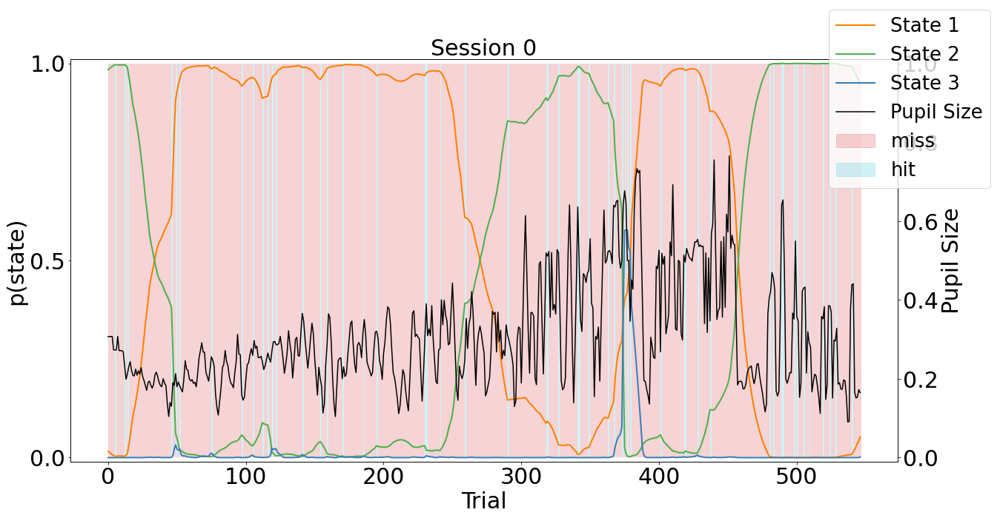

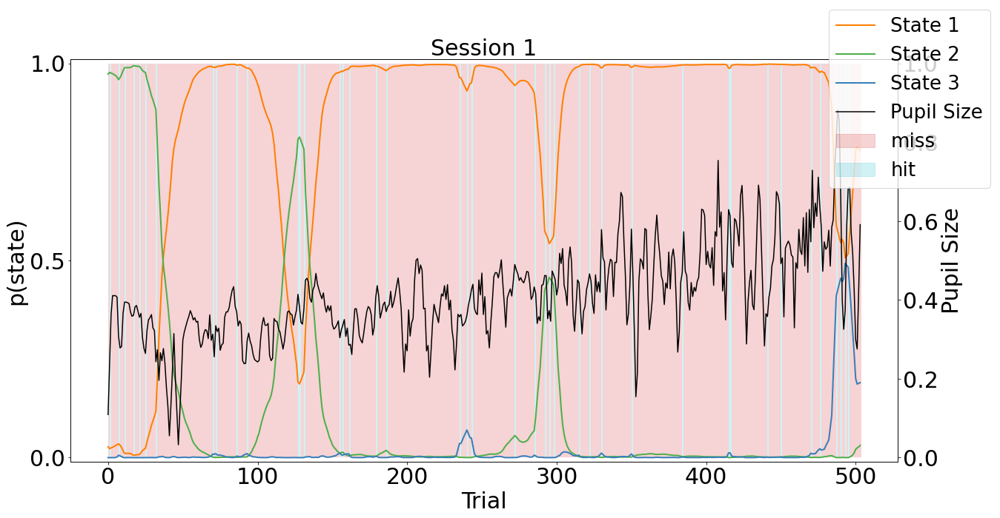

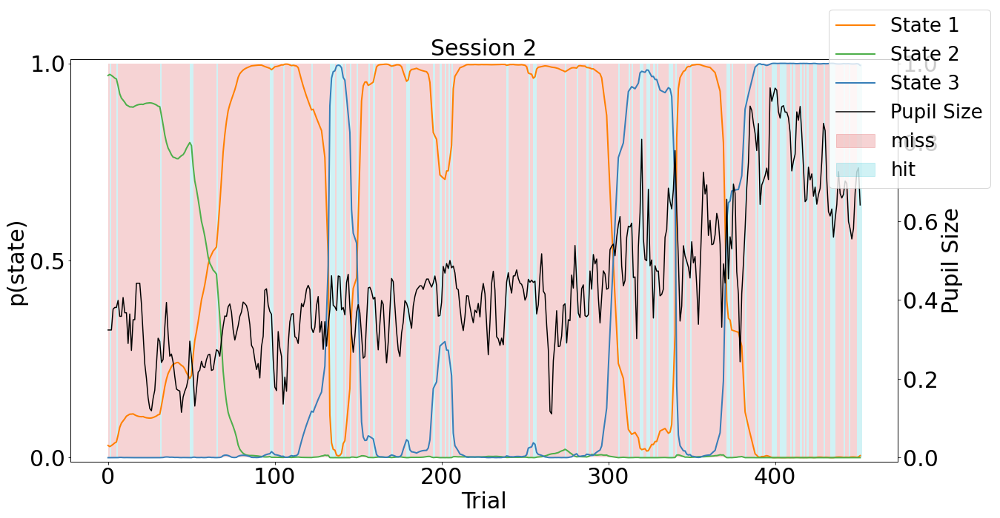

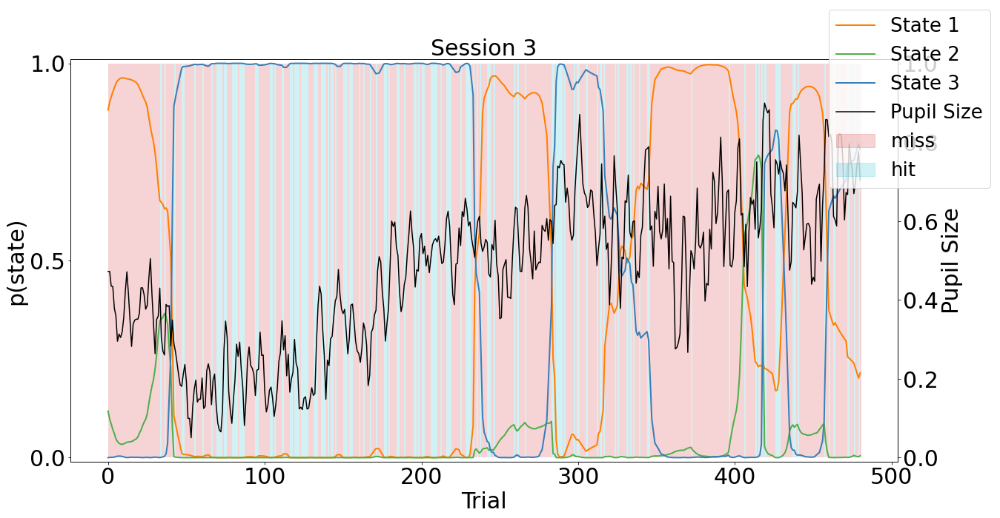

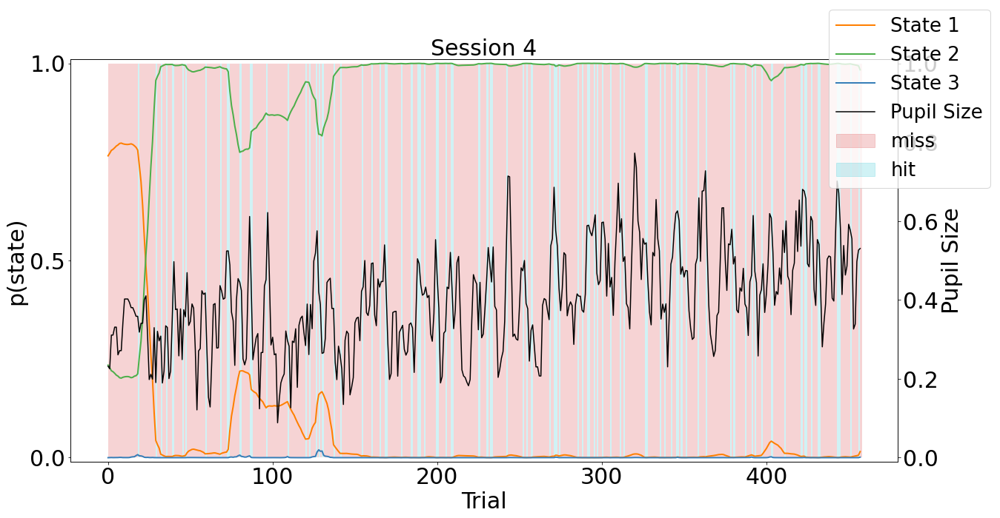

In [81]:
#500 ms before lick. raw data. small smoothing
which_behavioral_event = 'lick'#'lick, reward, stimulus'
time_window = 500#ms
pupil_stat = 'raw'#raw or derivative
event_side = 'before'#before or after
smoothing_window = 3
pupilPlusStatePlot(which_behavioral_event, pupil_stat, event_side, time_window, smoothing_window)


/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'hdmf-common' version 1.2.0 because version 1.5.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'core' version 2.2.5 because version 2.3.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'hdmf-common' version 1.2.0 because version 1.5.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: I

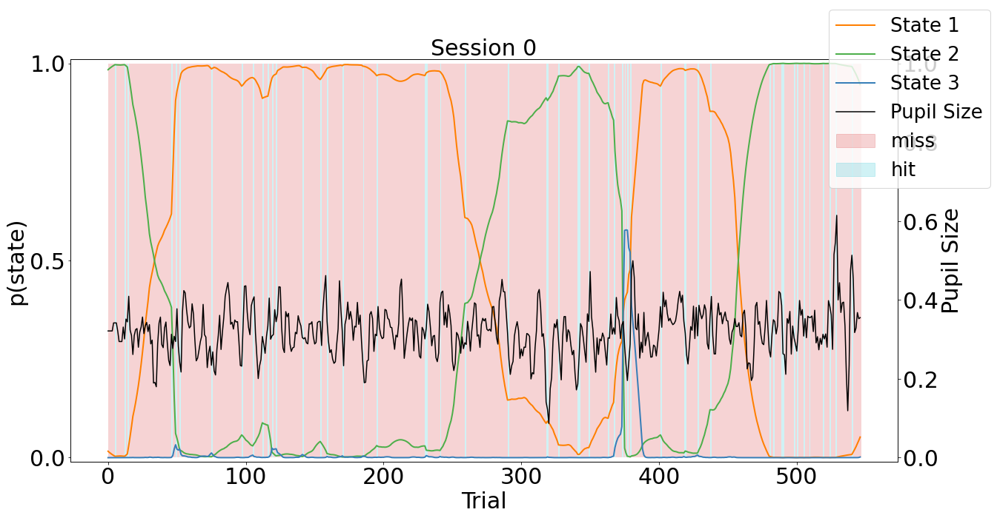

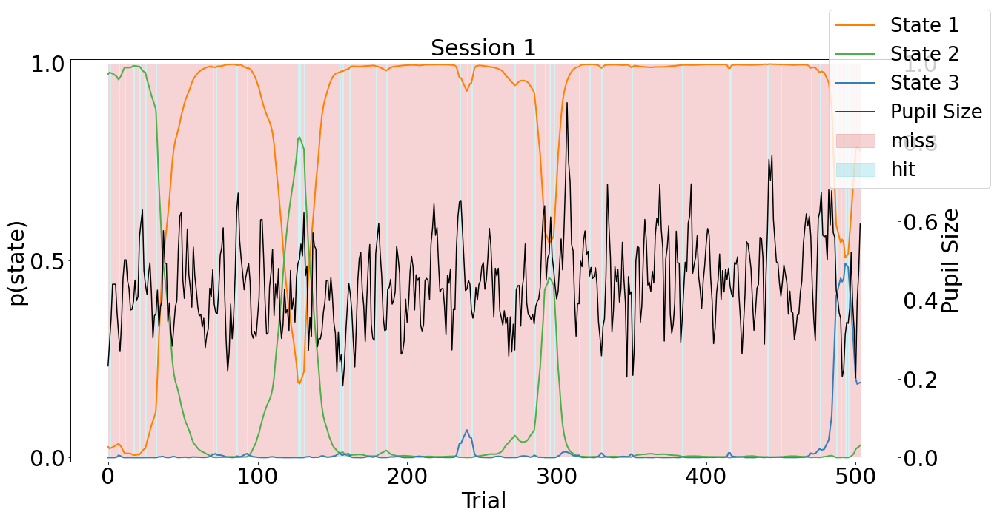

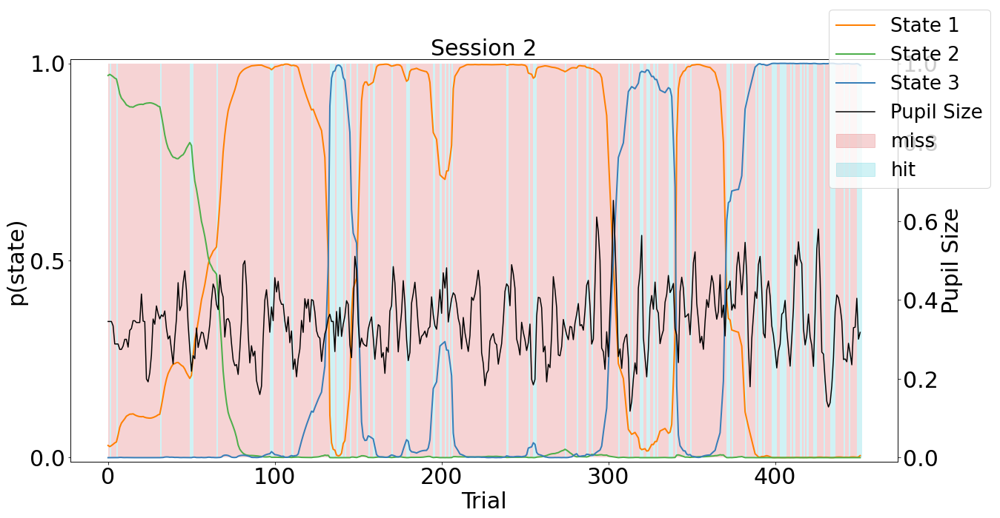

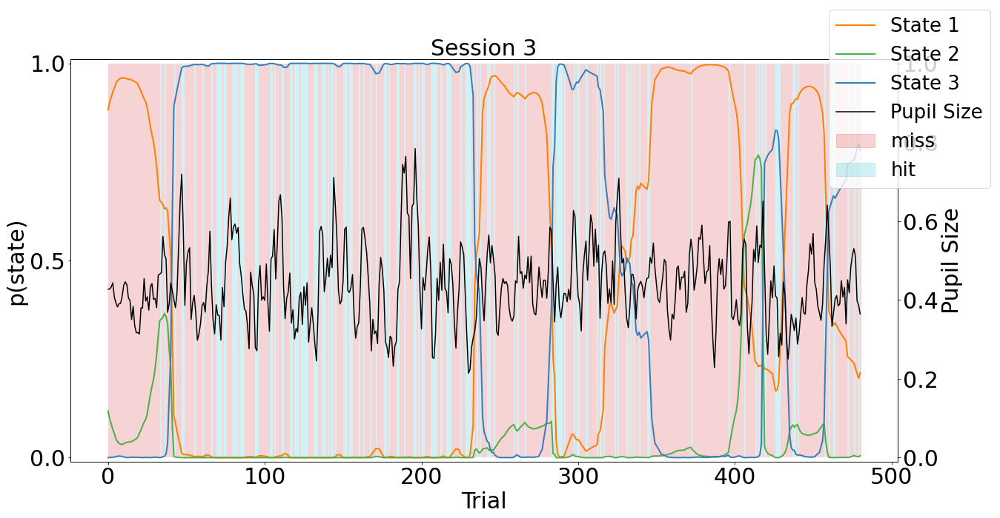

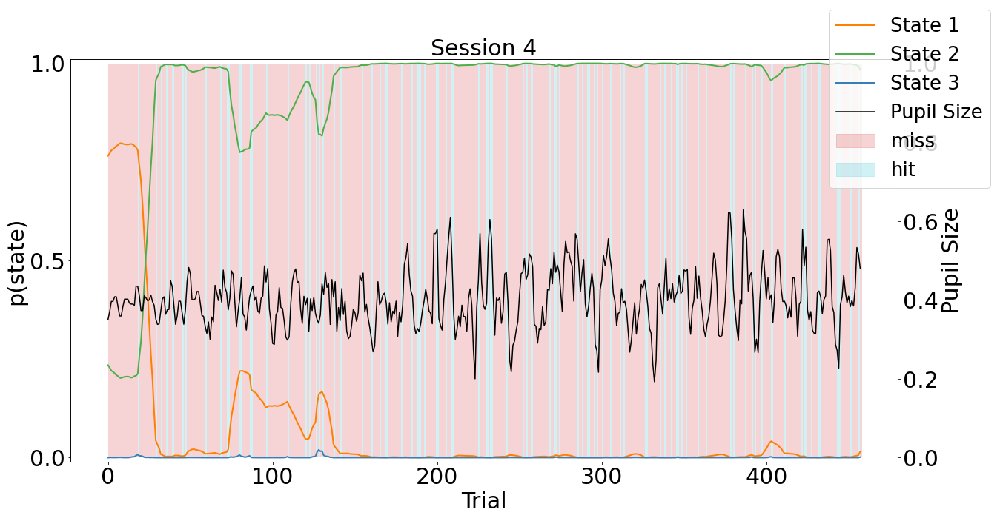

In [82]:
#500 ms before lick. derivative data. small smoothing
which_behavioral_event = 'lick'#'lick, reward, stimulus'
time_window = 500#ms
pupil_stat = 'derivative'#raw or derivative
event_side = 'before'#before or after
smoothing_window = 3
pupilPlusStatePlot(which_behavioral_event, pupil_stat, event_side, time_window, smoothing_window)

/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'hdmf-common' version 1.2.0 because version 1.5.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'core' version 2.2.5 because version 2.3.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'hdmf-common' version 1.2.0 because version 1.5.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: I

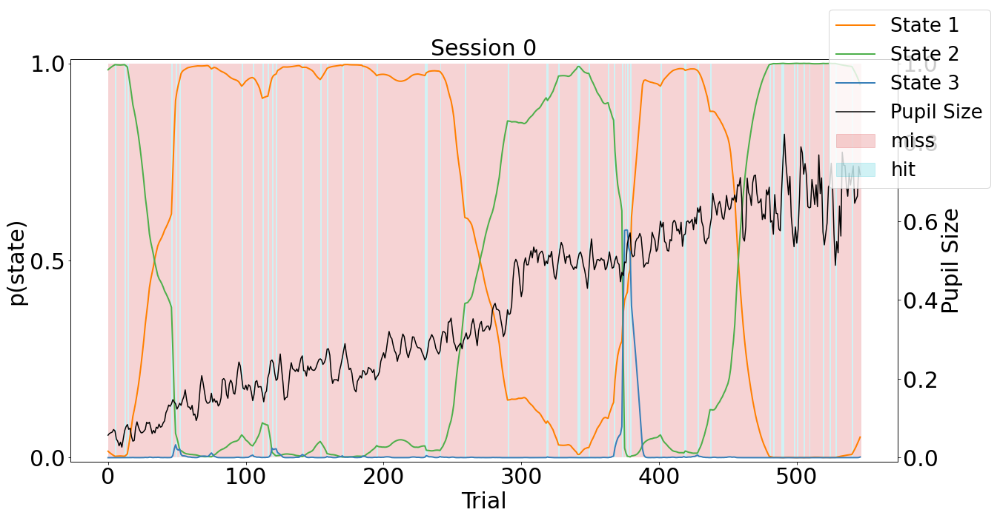

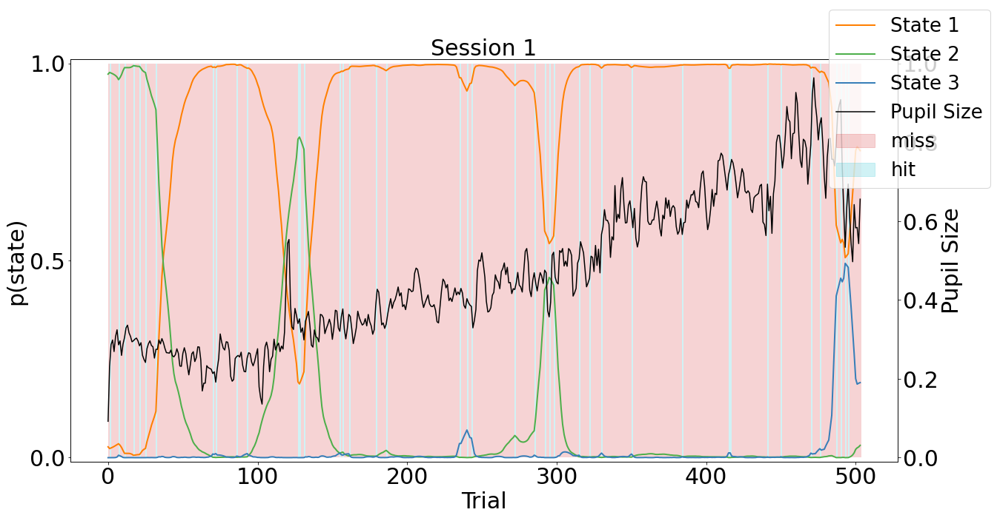

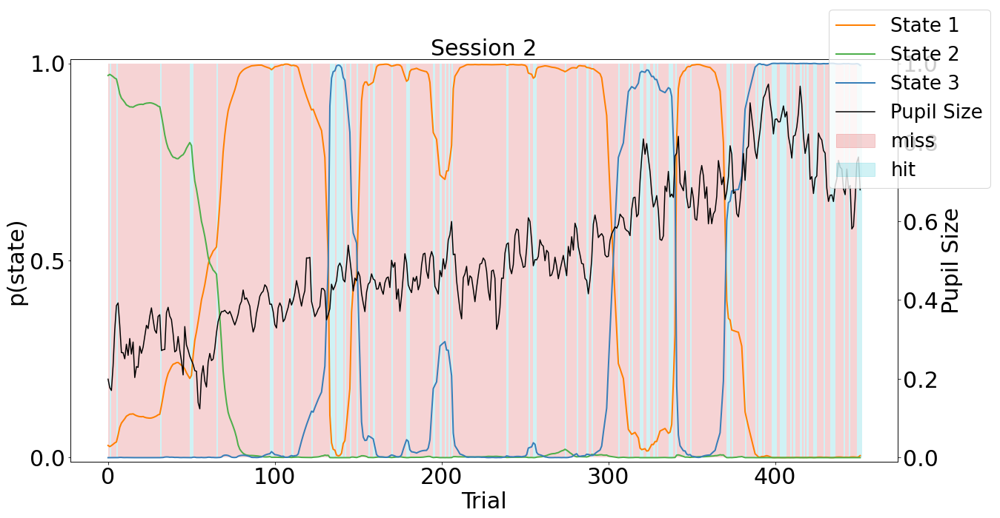

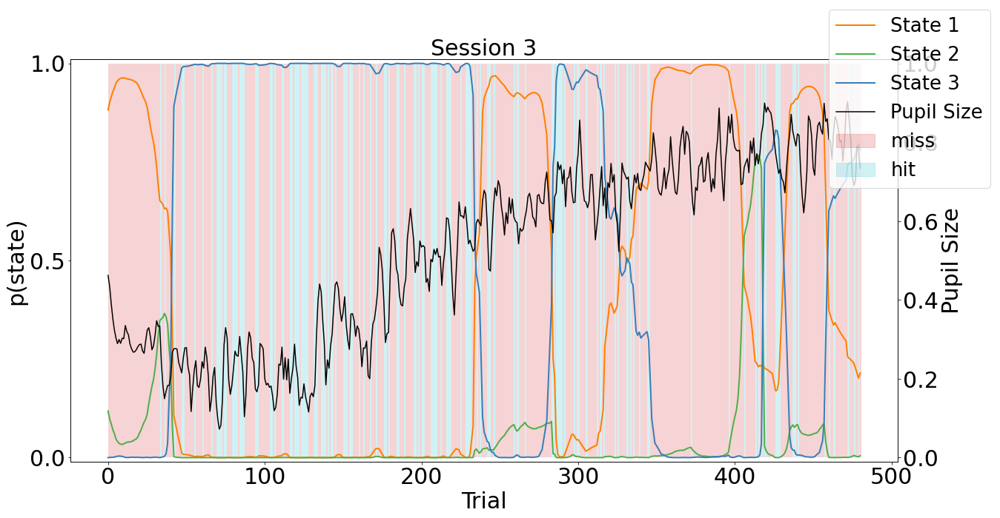

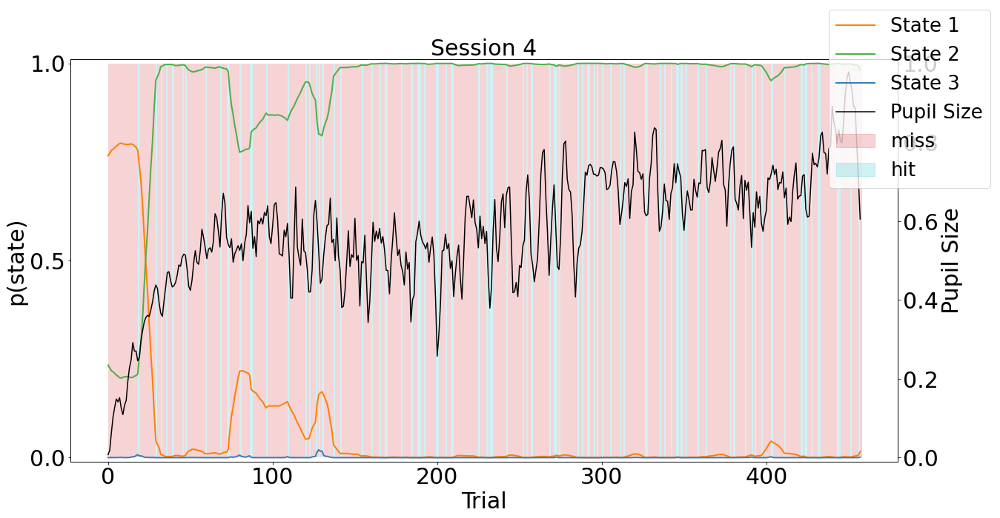

In [83]:
#500 ms after reward. raw data. small smoothing
which_behavioral_event = 'reward'#'lick, reward, stimulus'
time_window = 500#ms
pupil_stat = 'raw'#raw or derivative
event_side = 'after'#before or after
smoothing_window = 3
pupilPlusStatePlot(which_behavioral_event, pupil_stat, event_side, time_window, smoothing_window)

/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'hdmf-common' version 1.2.0 because version 1.5.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'core' version 2.2.5 because version 2.3.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'hdmf-common' version 1.2.0 because version 1.5.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: I

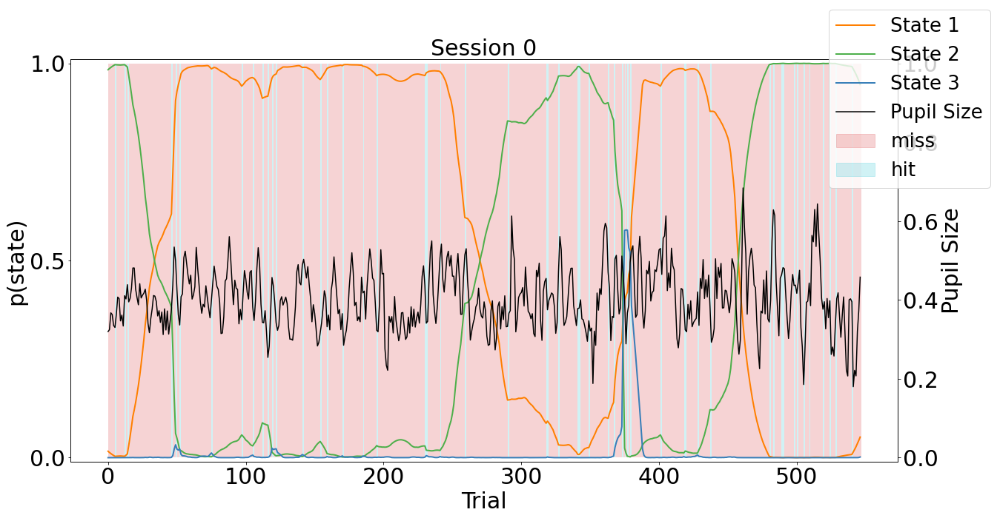

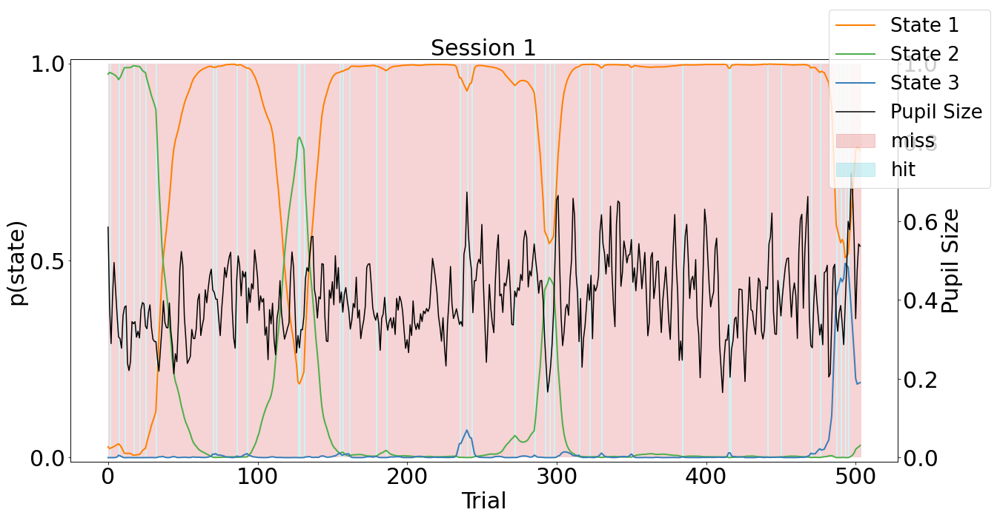

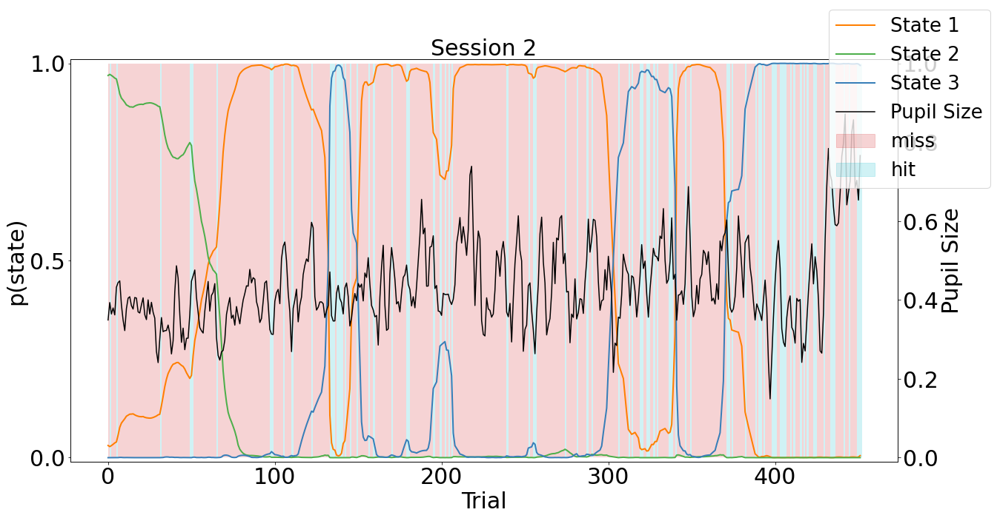

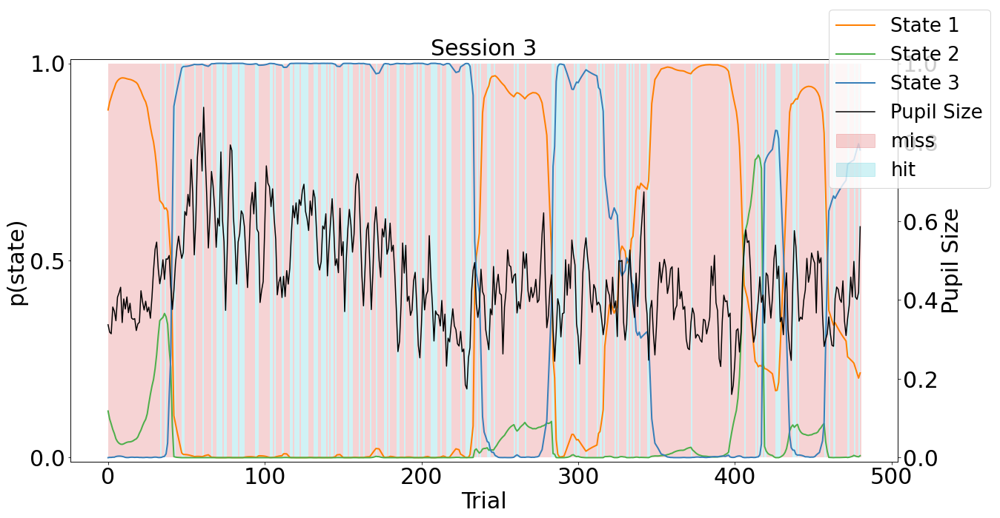

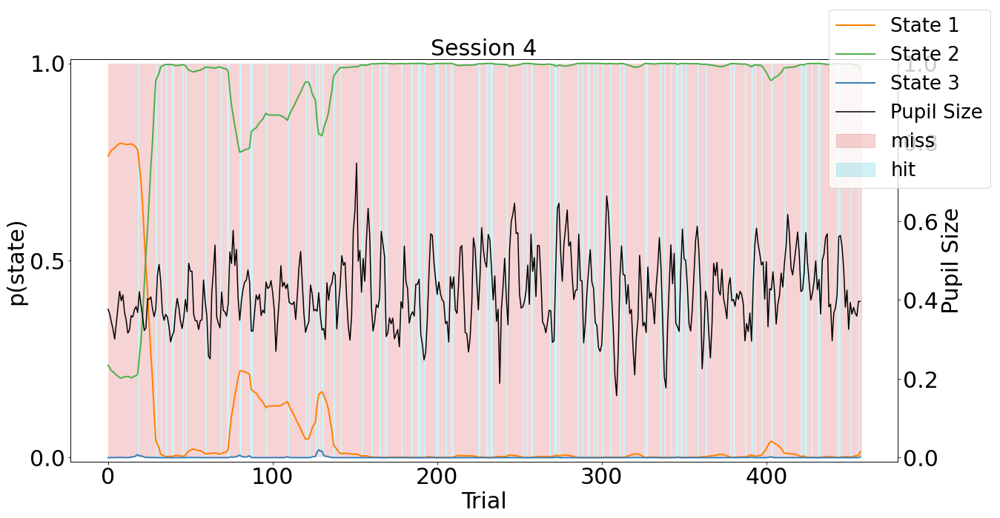

In [84]:
#500 ms before reward. derivative data. small smoothing
which_behavioral_event = 'reward'#'lick, reward, stimulus'
time_window = 500#ms
pupil_stat = 'derivative'#raw or derivative
event_side = 'after'#before or after
smoothing_window = 3
pupilPlusStatePlot(which_behavioral_event, pupil_stat, event_side, time_window, smoothing_window)        

/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'hdmf-common' version 1.2.0 because version 1.5.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'core' version 2.2.5 because version 2.3.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'hdmf-common' version 1.2.0 because version 1.5.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: I

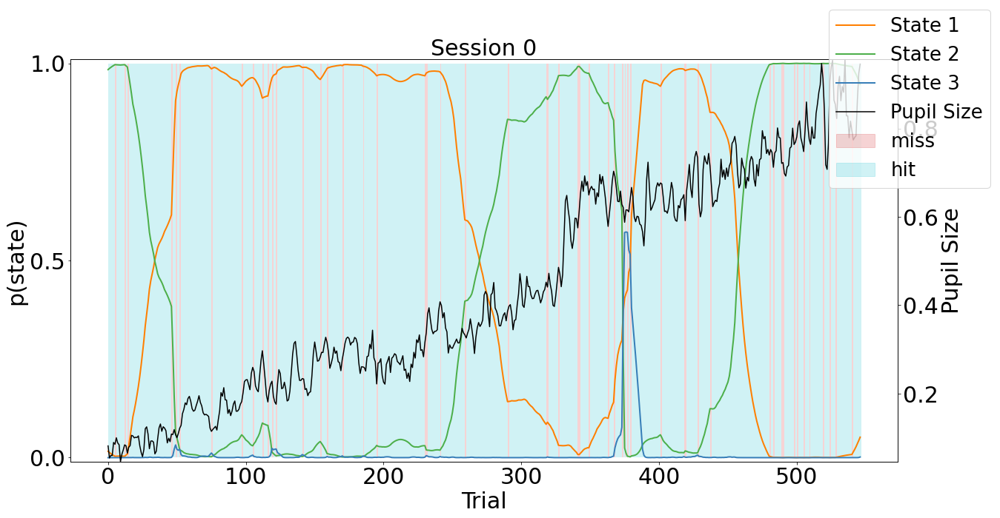

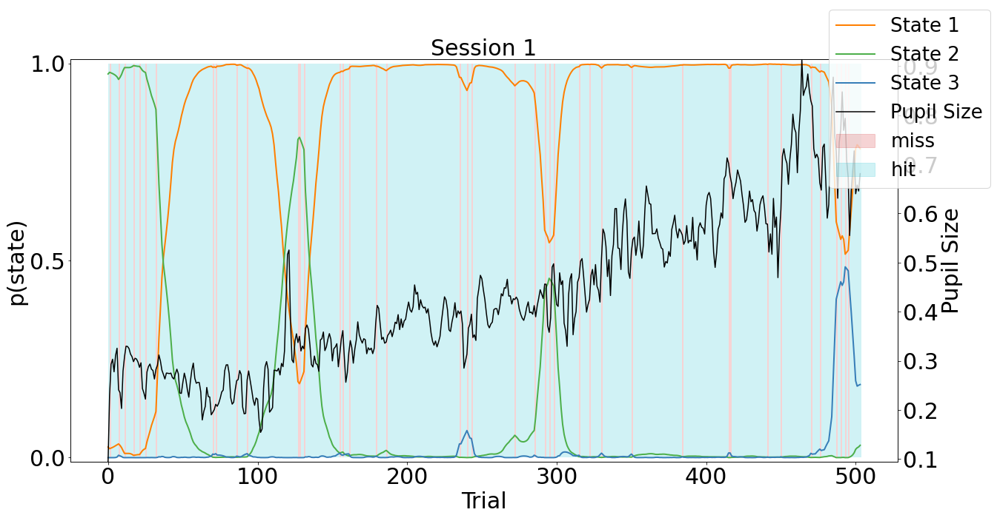

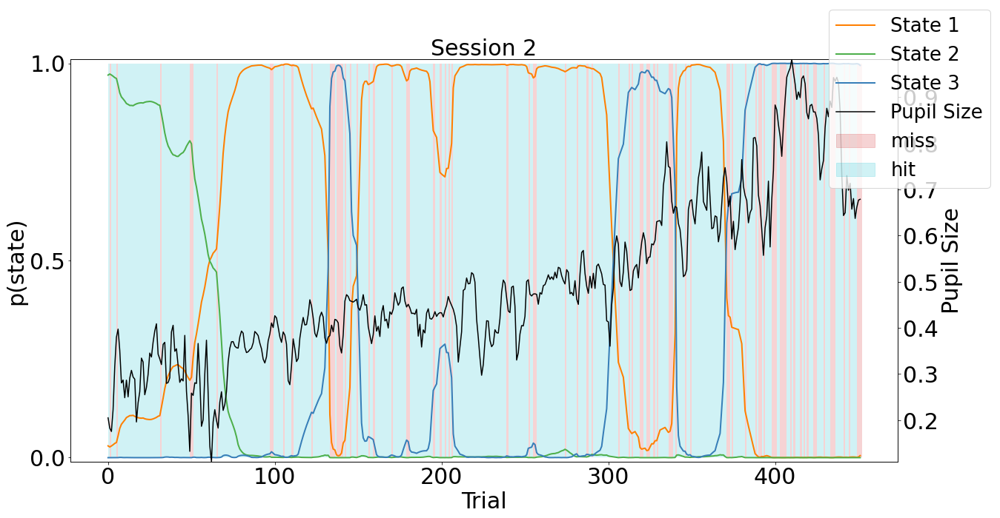

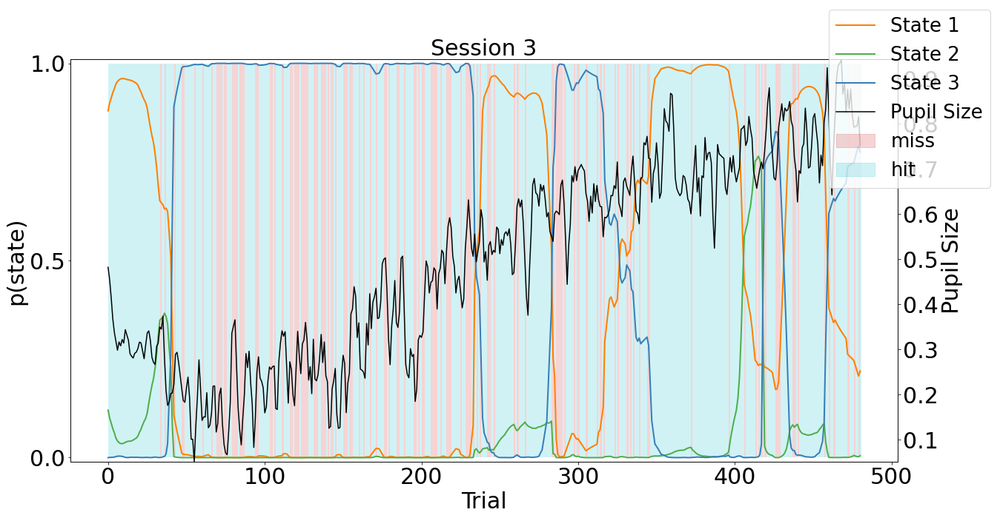

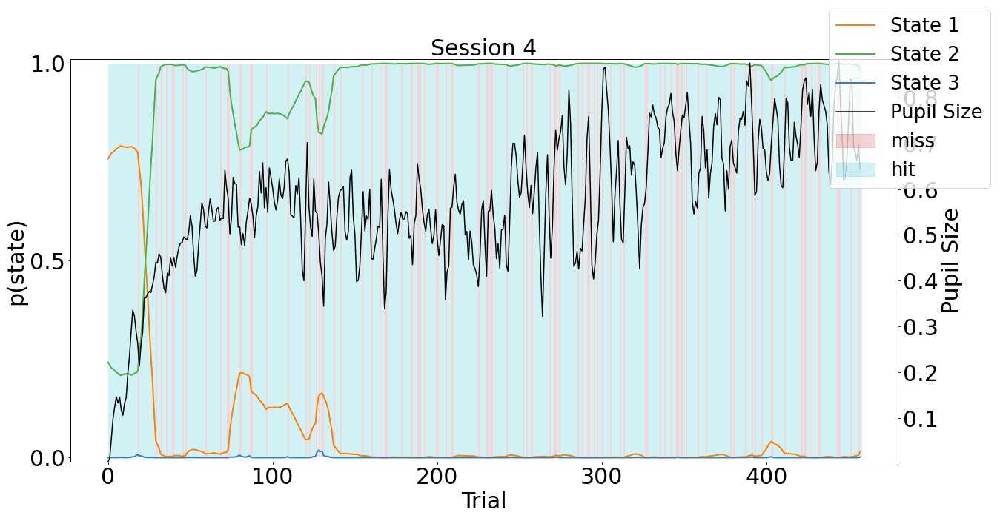

In [25]:
#500 ms before stimulus. raw data. small smoothing
which_behavioral_event = 'stimulus'#'lick, reward, stimulus'
time_window = 500#ms
pupil_stat = 'raw'#raw or derivative
event_side = 'before'#before or after
smoothing_window = 3
pupil_norm = 'minmax'
save_filename = '500preStim_MinMaxRaw'
pupilPlusStatePlot(which_behavioral_event, pupil_stat, 
                   event_side, time_window, smoothing_window, 
                   pupil_norm, save_filename=save_filename)

/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'hdmf-common' version 1.2.0 because version 1.5.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'core' version 2.2.5 because version 2.3.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'hdmf-common' version 1.2.0 because version 1.5.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: I

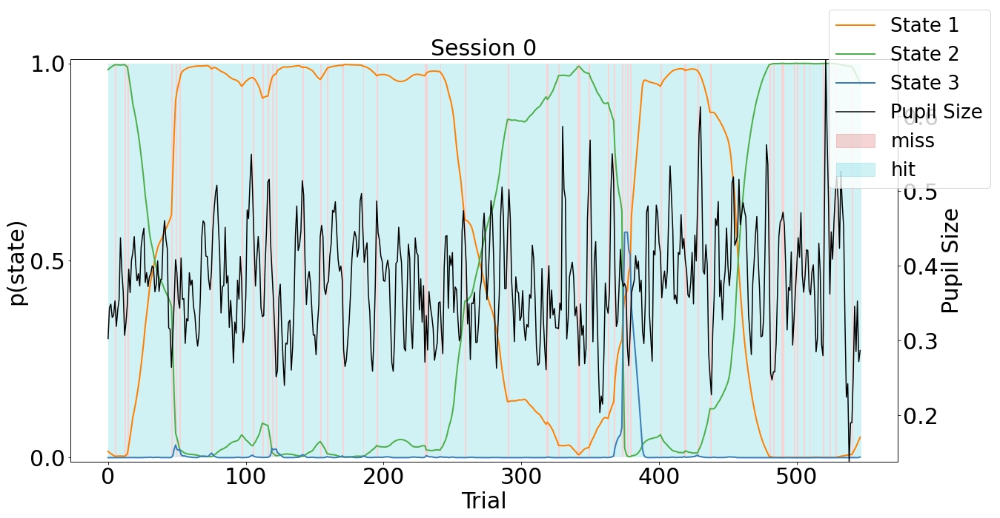

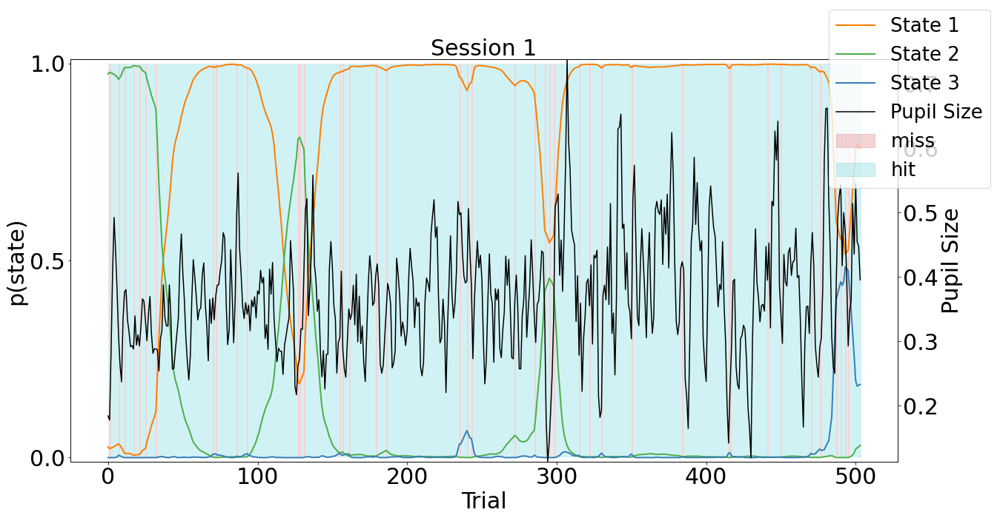

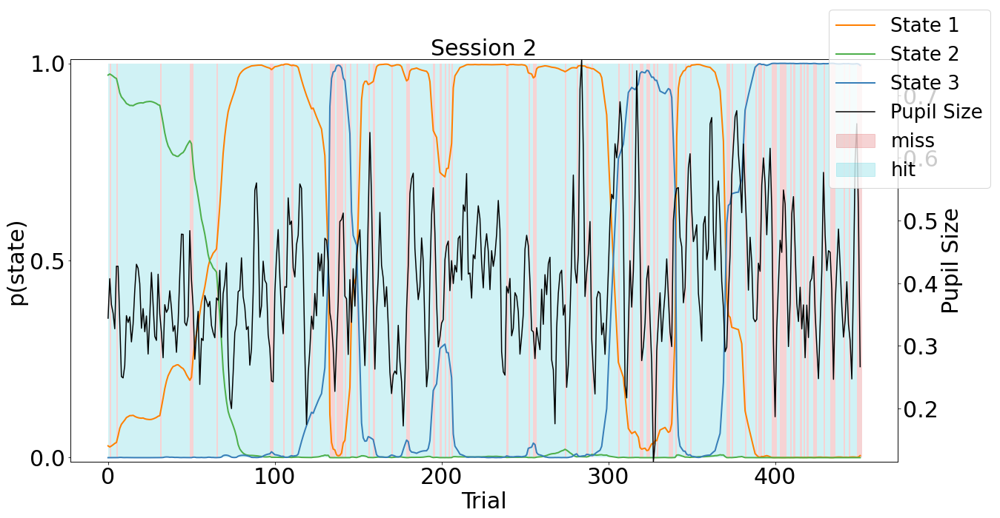

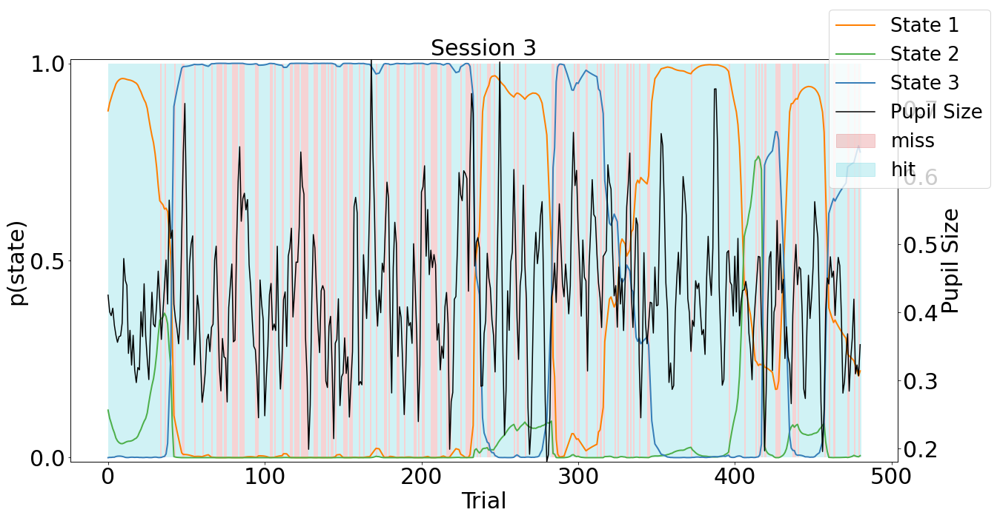

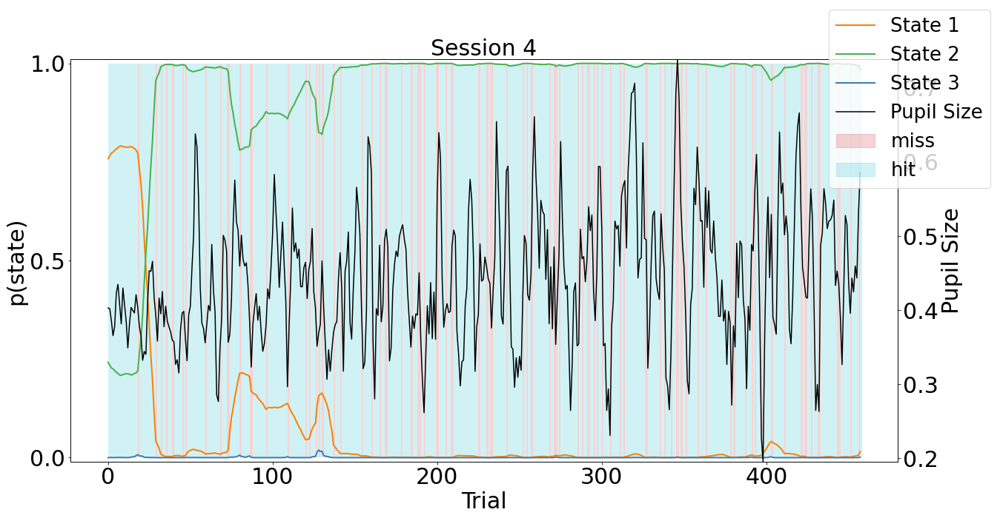

In [26]:
#500 ms before stimulus. derivative data. small smoothing
which_behavioral_event = 'stimulus'#'lick, reward, stimulus'
time_window = 500#ms
pupil_stat = 'derivative'#raw or derivative
event_side = 'before'#before or after
smoothing_window = 3
pupil_norm = 'minmax'
save_filename = '500preStim_MinMaxDeriv'
pupilPlusStatePlot(which_behavioral_event, pupil_stat, 
                   event_side, time_window, smoothing_window, 
                   pupil_norm, save_filename=save_filename)

/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'hdmf-common' version 1.2.0 because version 1.5.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'core' version 2.2.5 because version 2.3.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'hdmf-common' version 1.2.0 because version 1.5.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: I

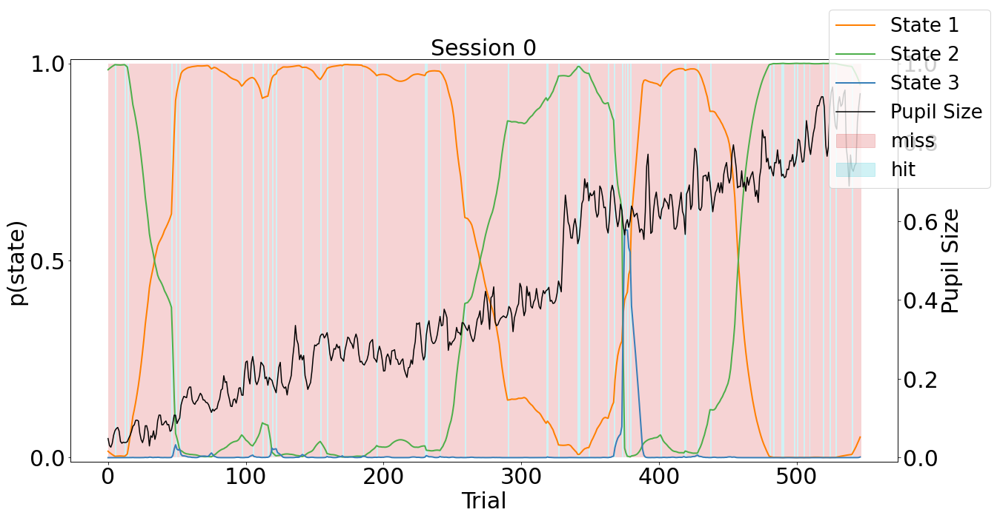

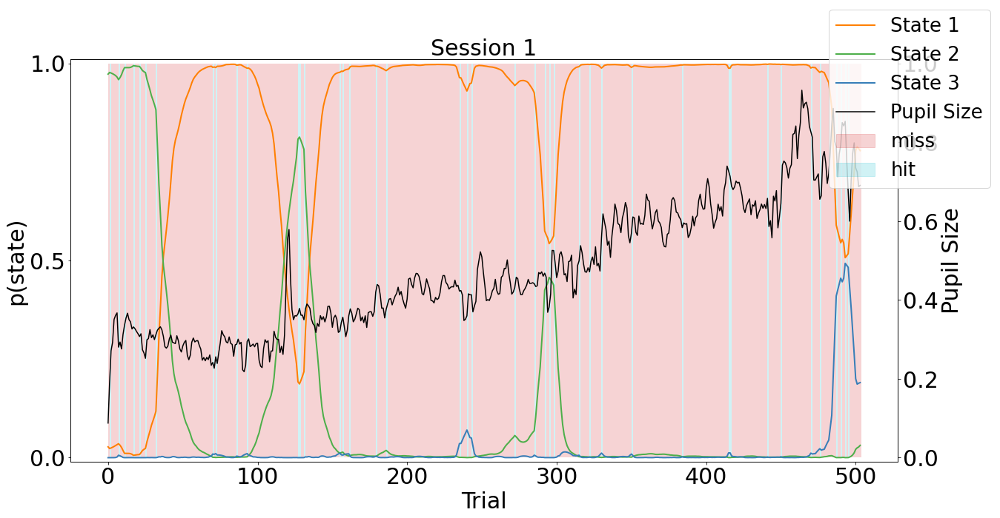

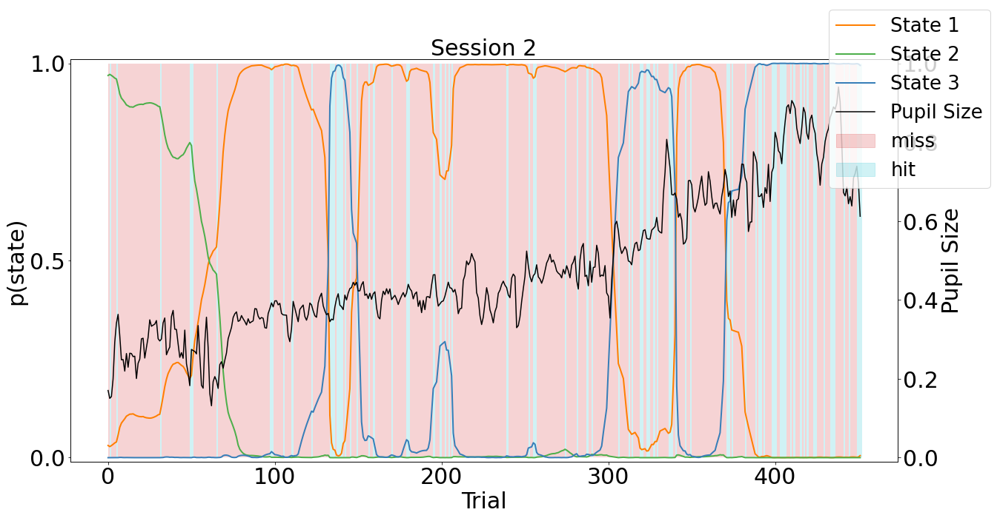

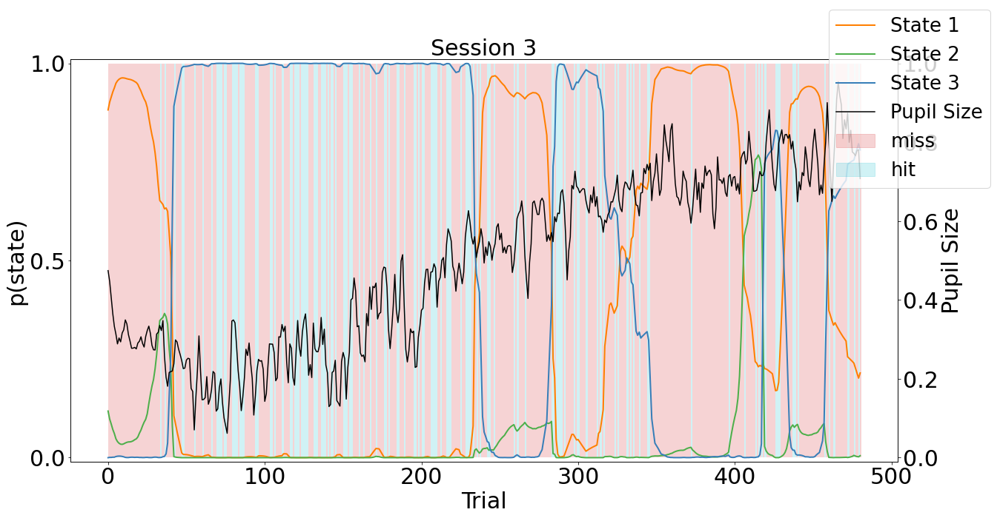

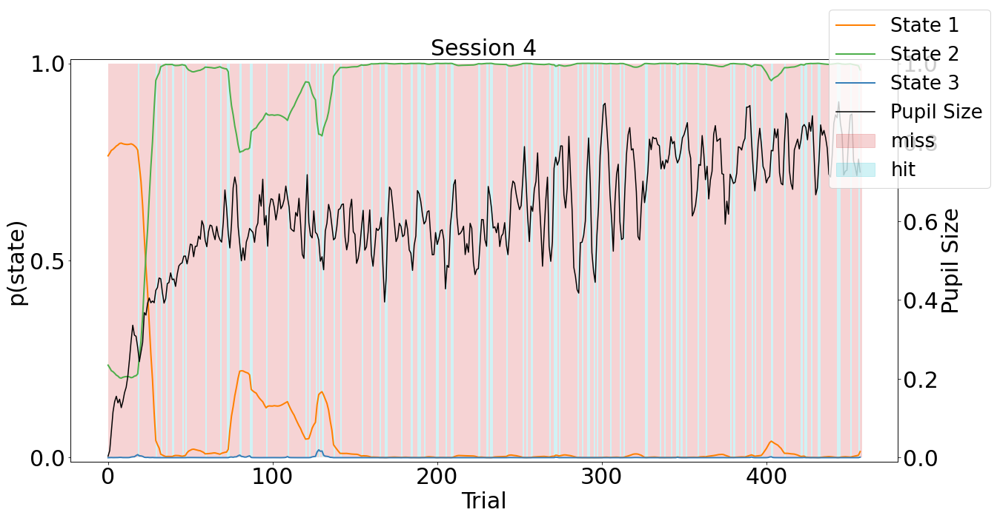

In [87]:
#500 ms after stimulus. raw data. small smoothing
which_behavioral_event = 'stimulus'#'lick, reward, stimulus'
time_window = 500#ms
pupil_stat = 'raw'#raw or derivative
event_side = 'after'#before or after
smoothing_window = 3
pupilPlusStatePlot(which_behavioral_event, pupil_stat, event_side, time_window, smoothing_window)


/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'hdmf-common' version 1.2.0 because version 1.5.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'core' version 2.2.5 because version 2.3.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: Ignoring cached namespace 'hdmf-common' version 1.2.0 because version 1.5.0 is already loaded.
  % (ns['name'], ns['version'], self.__namespaces.get(ns['name'])['version']))
/Users/danielburnham/opt/anaconda3/envs/uobrainflex/lib/python3.6/site-packages/hdmf/spec/namespace.py:533: UserWarning: I

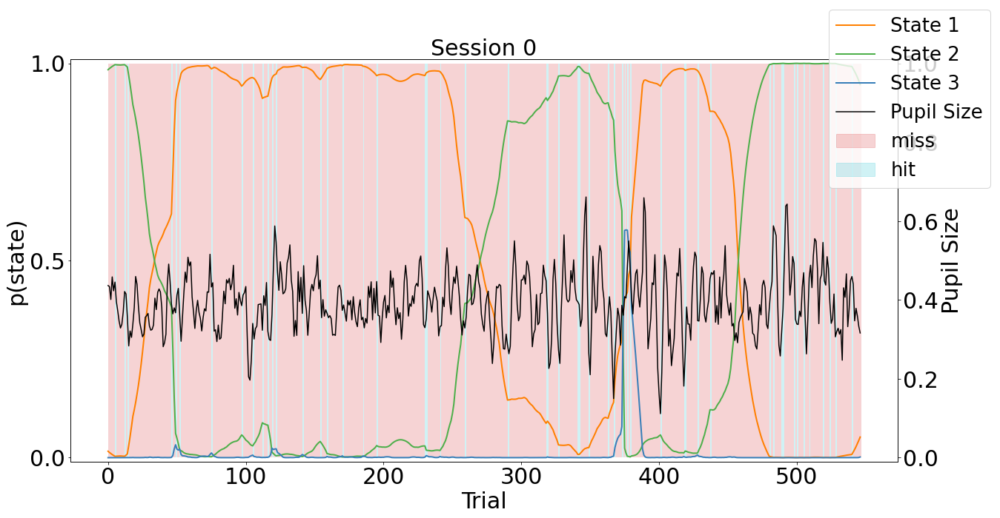

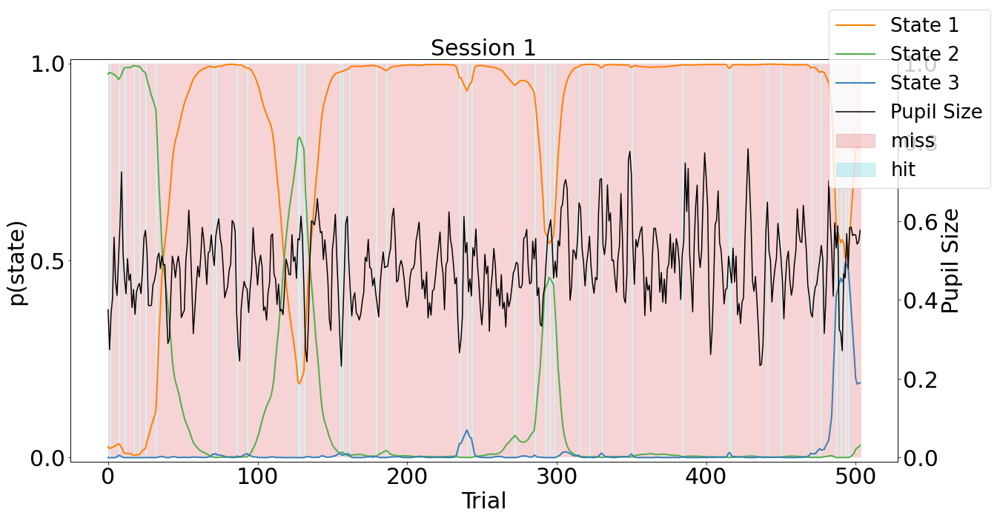

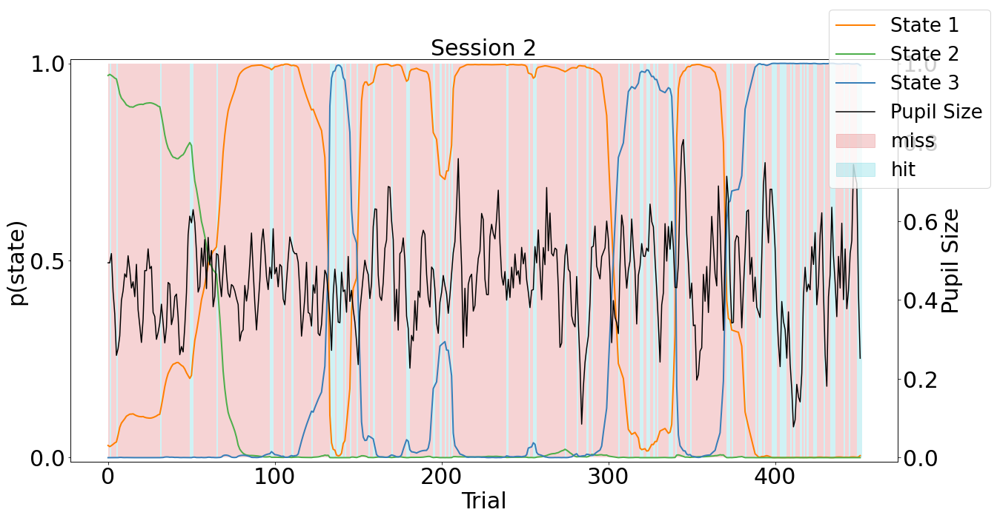

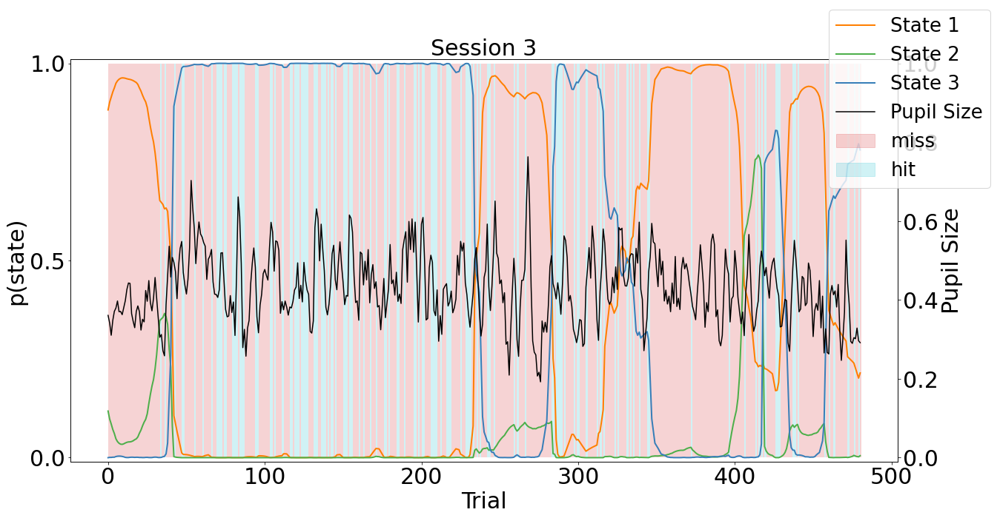

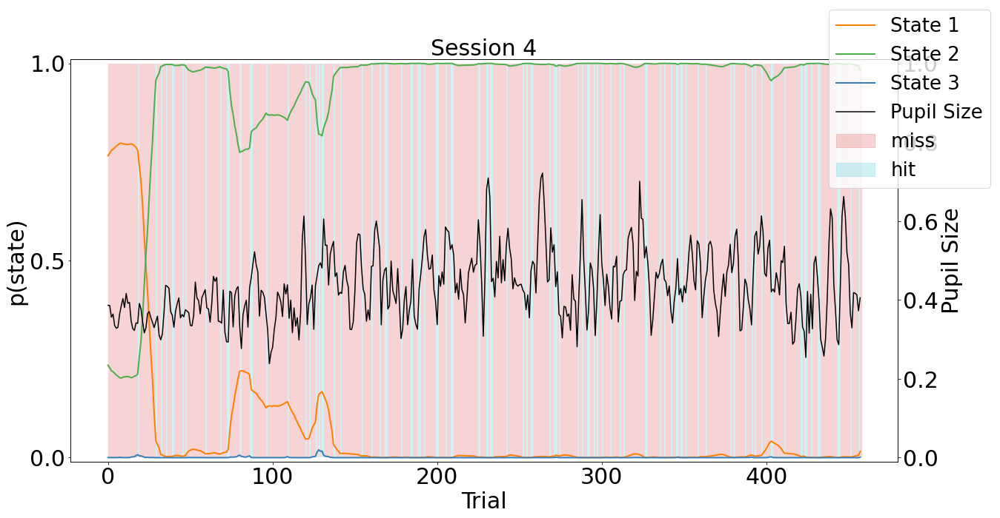

In [88]:
#500 ms after stimulus. derivative data. small smoothing
which_behavioral_event = 'stimulus'#'lick, reward, stimulus'
time_window = 500#ms
pupil_stat = 'derivative'#raw or derivative
event_side = 'after'#before or after
smoothing_window = 3
pupilPlusStatePlot(which_behavioral_event, pupil_stat, event_side, time_window, smoothing_window)

In [27]:
posterior_probs[ind][:, indst].shape

(458,)